In [1]:
import math
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import style
import matplotlib as mpl
import paste
import scipy
import anndata
import os
import umap
from sklearn.decomposition import PCA
import scanpy as sc
import warnings
import json
from PIL import Image
import torch
import seaborn
from torch import nn
import torch.nn.functional as F
import cv2
from tqdm import tqdm
from matplotlib.colors import rgb2hex
import random

In [2]:
from open_clip import create_model_from_pretrained, get_tokenizer
import open_clip

In [3]:
PATCH_DIR = "/condo/wanglab/shared/wxc/clip/data/human/ST_data/images/patches/"
DEVICE = "cuda"

In [4]:
pca = PCA(n_components=3)

In [5]:
import pycpd
from builtins import super
import numbers

In [6]:
class EMRegistration(object):
    """
    Expectation maximization point cloud registration.

    Attributes
    ----------
    X: numpy array
        NxD array of target points.

    Y: numpy array
        MxD array of source points.

    TY: numpy array
        MxD array of transformed source points.

    sigma2: float (positive)
        Initial variance of the Gaussian mixture model.

    N: int
        Number of target points.

    M: int
        Number of source points.

    D: int
        Dimensionality of source and target points

    iteration: int
        The current iteration throughout registration.

    max_iterations: int
        Registration will terminate once the algorithm has taken this
        many iterations.

    tolerance: float (positive)
        Registration will terminate once the difference between
        consecutive objective function values falls within this tolerance.

    w: float (between 0 and 1)
        Contribution of the uniform distribution to account for outliers.
        Valid values span 0 (inclusive) and 1 (exclusive).

    q: float
        The objective function value that represents the misalignment between source
        and target point clouds.

    diff: float (positive)
        The absolute difference between the current and previous objective function values.

    P: numpy array
        MxN array of probabilities.
        P[m, n] represents the probability that the m-th source point
        corresponds to the n-th target point.

    Pt1: numpy array
        Nx1 column array.
        Multiplication result between the transpose of P and a column vector of all 1s.

    P1: numpy array
        Mx1 column array.
        Multiplication result between P and a column vector of all 1s.

    Np: float (positive)
        The sum of all elements in P.

    """

    def __init__(self, X, Y, sigma2=None, max_iterations=None, tolerance=None, w=None, *args, **kwargs):
        if type(X) is not np.ndarray or X.ndim != 2:
            raise ValueError(
                "The target point cloud (X) must be at a 2D numpy array.")

        if type(Y) is not np.ndarray or Y.ndim != 2:
            raise ValueError(
                "The source point cloud (Y) must be a 2D numpy array.")

        if X.shape[1] != Y.shape[1]:
            raise ValueError(
                "Both point clouds need to have the same number of dimensions.")

        if sigma2 is not None and (not isinstance(sigma2, numbers.Number) or sigma2 <= 0):
            raise ValueError(
                "Expected a positive value for sigma2 instead got: {}".format(sigma2))

        if max_iterations is not None and (not isinstance(max_iterations, numbers.Number) or max_iterations < 0):
            raise ValueError(
                "Expected a positive integer for max_iterations instead got: {}".format(max_iterations))
        elif isinstance(max_iterations, numbers.Number) and not isinstance(max_iterations, int):
            warn("Received a non-integer value for max_iterations: {}. Casting to integer.".format(max_iterations))
            max_iterations = int(max_iterations)

        if tolerance is not None and (not isinstance(tolerance, numbers.Number) or tolerance < 0):
            raise ValueError(
                "Expected a positive float for tolerance instead got: {}".format(tolerance))

        if w is not None and (not isinstance(w, numbers.Number) or w < 0 or w >= 1):
            raise ValueError(
                "Expected a value between 0 (inclusive) and 1 (exclusive) for w instead got: {}".format(w))

        self.X = X
        self.Y = Y
        self.TY = Y
        self.sigma2 = initialize_sigma2(X, Y) if sigma2 is None else sigma2
        (self.N, self.D) = self.X.shape
        (self.M, _) = self.Y.shape
        self.tolerance = 0.001 if tolerance is None else tolerance
        self.w = 0.0 if w is None else w
        self.max_iterations = 100 if max_iterations is None else max_iterations
        self.iteration = 0
        self.diff = np.inf
        self.q = np.inf
        self.P = np.zeros((self.M, self.N))
        self.Pt1 = np.zeros((self.N, ))
        self.P1 = np.zeros((self.M, ))
        self.PX = np.zeros((self.M, self.D))
        self.Np = 0

    def register(self, callback=lambda **kwargs: None):
        """
        Perform the EM registration.

        Attributes
        ----------
        callback: function
            A function that will be called after each iteration.
            Can be used to visualize the registration process.
        
        Returns
        -------
        self.TY: numpy array
            MxD array of transformed source points.
        
        registration_parameters:
            Returned params dependent on registration method used. 
        """
        self.transform_point_cloud()
        while self.iteration < self.max_iterations and self.diff > self.tolerance:
            self.iterate()
            if callable(callback):
                kwargs = {'iteration': self.iteration,
                          'error': self.q, 'X': self.X, 'Y': self.TY}
                callback(**kwargs)

        return self.TY, self.get_registration_parameters()

    def get_registration_parameters(self):
        """
        Placeholder for child classes.
        """
        raise NotImplementedError(
            "Registration parameters should be defined in child classes.")

    def update_transform(self):
        """
        Placeholder for child classes.
        """
        raise NotImplementedError(
            "Updating transform parameters should be defined in child classes.")

    def transform_point_cloud(self):
        """
        Placeholder for child classes.
        """
        raise NotImplementedError(
            "Updating the source point cloud should be defined in child classes.")

    def update_variance(self):
        """
        Placeholder for child classes.
        """
        raise NotImplementedError(
            "Updating the Gaussian variance for the mixture model should be defined in child classes.")

    def iterate(self):
        """
        Perform one iteration of the EM algorithm.
        """
        self.expectation()
        self.maximization()
        self.iteration += 1

    def expectation(self):
        """
        Compute the expectation step of the EM algorithm.
        """
        P = np.sum((self.X[None, :, :] - self.TY[:, None, :])**2, axis=2) # (M, N)
        P = np.exp(-P/(2*self.sigma2))
        c = (2*np.pi*self.sigma2)**(self.D/2)*self.w/(1. - self.w)*self.M/self.N

        den = np.sum(P, axis = 0, keepdims = True) # (1, N)
        den = np.clip(den, np.finfo(self.X.dtype).eps, None) + c

        self.P = np.divide(P, den)
        self.Pt1 = np.sum(self.P, axis=0)
        self.P1 = np.sum(self.P, axis=1)
        self.Np = np.sum(self.P1)
        self.PX = np.matmul(self.P, self.X)

    def maximization(self):
        """
        Compute the maximization step of the EM algorithm.
        """
        self.update_transform()
        self.transform_point_cloud()
        self.update_variance()

In [7]:
def initialize_sigma2(X, Y):
    """
    Initialize the variance (sigma2).

    Attributes
    ----------
    X: numpy array
        NxD array of points for target.
    
    Y: numpy array
        MxD array of points for source.
    
    Returns
    -------
    sigma2: float
        Initial variance.
    """
    (N, D) = X.shape
    (M, _) = Y.shape
    diff = X[None, :, :] - Y[:, None, :]
    err = diff ** 2
    return np.sum(err) / (D * M * N)
    
def gaussian_kernel(X, beta, Y=None):
    if Y is None:
        Y = X
    diff = X[:, None, :] - Y[None, :,  :]
    diff = np.square(diff)
    diff = np.sum(diff, 2)
    return np.exp(-diff / (2 * beta**2))

def low_rank_eigen(G, num_eig):
    """
    Calculate num_eig eigenvectors and eigenvalues of gaussian matrix G.
    Enables lower dimensional solving.
    """
    S, Q = np.linalg.eigh(G)
    eig_indices = list(np.argsort(np.abs(S))[::-1][:num_eig])
    Q = Q[:, eig_indices]  # eigenvectors
    S = S[eig_indices]  # eigenvalues.
    return Q, S

In [8]:
class DeformableRegistration(EMRegistration):
    """
    Deformable registration.

    Attributes
    ----------
    alpha: float (positive)
        Represents the trade-off between the goodness of maximum likelihood fit and regularization.

    beta: float(positive)
        Width of the Gaussian kernel.
    
    low_rank: bool
        Whether to use low rank approximation.
    
    num_eig: int
        Number of eigenvectors to use in lowrank calculation.
    """

    def __init__(self, alpha=None, beta=None, low_rank=False, num_eig=100, *args, **kwargs):
        super().__init__(*args, **kwargs)
        if alpha is not None and (not isinstance(alpha, numbers.Number) or alpha <= 0):
            raise ValueError(
                "Expected a positive value for regularization parameter alpha. Instead got: {}".format(alpha))

        if beta is not None and (not isinstance(beta, numbers.Number) or beta <= 0):
            raise ValueError(
                "Expected a positive value for the width of the coherent Gaussian kerenl. Instead got: {}".format(beta))

        self.alpha = 2 if alpha is None else alpha
        self.beta = 2 if beta is None else beta
        self.W = np.zeros((self.M, self.D))
        self.G = gaussian_kernel(self.Y, self.beta)
        self.low_rank = low_rank
        self.num_eig = num_eig
        if self.low_rank is True:
            self.Q, self.S = low_rank_eigen(self.G, self.num_eig)
            self.inv_S = np.diag(1./self.S)
            self.S = np.diag(self.S)
            self.E = 0.

    def update_transform(self):
        """
        Calculate a new estimate of the deformable transformation.
        See Eq. 22 of https://arxiv.org/pdf/0905.2635.pdf.

        """
        if self.low_rank is False:
            A = np.dot(np.diag(self.P1), self.G) + \
                self.alpha * self.sigma2 * np.eye(self.M)
            B = self.PX - np.dot(np.diag(self.P1), self.Y)
            self.W = np.linalg.solve(A, B)

        elif self.low_rank is True:
            # Matlab code equivalent can be found here:
            # https://github.com/markeroon/matlab-computer-vision-routines/tree/master/third_party/CoherentPointDrift
            dP = np.diag(self.P1)
            dPQ = np.matmul(dP, self.Q)
            F = self.PX - np.matmul(dP, self.Y)

            self.W = 1 / (self.alpha * self.sigma2) * (F - np.matmul(dPQ, (
                np.linalg.solve((self.alpha * self.sigma2 * self.inv_S + np.matmul(self.Q.T, dPQ)),
                                (np.matmul(self.Q.T, F))))))
            QtW = np.matmul(self.Q.T, self.W)
            self.E = self.E + self.alpha / 2 * np.trace(np.matmul(QtW.T, np.matmul(self.S, QtW)))

    def transform_point_cloud(self, Y=None):
        """
        Update a point cloud using the new estimate of the deformable transformation.

        Attributes
        ----------
        Y: numpy array, optional
            Array of points to transform - use to predict on new set of points.
            Best for predicting on new points not used to run initial registration.
                If None, self.Y used.
        
        Returns
        -------
        If Y is None, returns None.
        Otherwise, returns the transformed Y.
                

        """
        self.W[:,2:]=0
        if Y is not None:
            G = gaussian_kernel(X=Y, beta=self.beta, Y=self.Y)
            return Y + np.dot(G, self.W)
        else:
            if self.low_rank is False:
                self.TY = self.Y + np.dot(self.G, self.W)

            elif self.low_rank is True:
                self.TY = self.Y + np.matmul(self.Q, np.matmul(self.S, np.matmul(self.Q.T, self.W)))
                return


    def update_variance(self):
        """
        Update the variance of the mixture model using the new estimate of the deformable transformation.
        See the update rule for sigma2 in Eq. 23 of of https://arxiv.org/pdf/0905.2635.pdf.

        """
        qprev = self.sigma2

        # The original CPD paper does not explicitly calculate the objective functional.
        # This functional will include terms from both the negative log-likelihood and
        # the Gaussian kernel used for regularization.
        self.q = np.inf

        xPx = np.dot(np.transpose(self.Pt1), np.sum(
            np.multiply(self.X, self.X), axis=1))
        yPy = np.dot(np.transpose(self.P1),  np.sum(
            np.multiply(self.TY, self.TY), axis=1))
        trPXY = np.sum(np.multiply(self.TY, self.PX))

        self.sigma2 = (xPx - 2 * trPXY + yPy) / (self.Np * self.D)

        if self.sigma2 <= 0:
            self.sigma2 = self.tolerance / 10

        # Here we use the difference between the current and previous
        # estimate of the variance as a proxy to test for convergence.
        self.diff = np.abs(self.sigma2 - qprev)

    def get_registration_parameters(self):
        """
        Return the current estimate of the deformable transformation parameters.


        Returns
        -------
        self.G: numpy array
            Gaussian kernel matrix.

        self.W: numpy array
            Deformable transformation matrix.
        """
        return self.G, self.W

In [9]:
def apply_homography(coordinates, H):
    """
    Apply a 3x3 homography matrix to 2D coordinates.

    :param coordinates: A numpy array of shape (n, 2) containing 2D coordinates.
    :param H: A numpy array of shape (3, 3) representing the homography matrix.
    :return: A numpy array of shape (n, 2) with transformed coordinates.
    """
    # Convert (x, y) to homogeneous coordinates (x, y, 1)
    n = coordinates.shape[0]
    homogeneous_coords = np.hstack((coordinates, np.ones((n, 1))))

    # Apply the homography matrix
    transformed_homogeneous = np.dot(homogeneous_coords, H.T)

    # Convert back from homogeneous coordinates (x', y', w') to (x'/w', y'/w')
    transformed_coords = transformed_homogeneous[:, :2] / transformed_homogeneous[:, [2]]

    return transformed_coords

# Functions

## Define Simulation functions

Takes a layer, rotates by angle. Next, we map all coordinates to closest integer coordinates.

This removes some points as two points who share the same closest integer pair will map to same coordinate.

In [10]:
def simulate_gene_exp(adata, pc):
    """
    Adds noise to gene expression data. The rows are simulated according to a Multinomial distribution, 
    with the total counts per spot drawn from a Negative Binomial Distribution.
    param: pc- Pseudocount to be added to dataframe
    param: factor - amount by which we scale the variance (to increase noise)
    """
    adata_sim = adata.copy()
    df = pd.DataFrame(adata_sim.X)
    # add pseudocounts 
    alpha = df.copy().to_numpy() + pc

    # get vector of total counts per spot
    n = df.sum(axis=1).to_numpy()

    # Reassign zero counts so we don't divide by 0 in future calcuation
    n[n == 0] = 1

    # convert to float
    alpha = np.array(alpha, dtype=np.float64)
    n = np.array(n, dtype=np.float64)

    # convert rows to unit vectors
    alpha = alpha/alpha.sum(axis=1)[:, None]

    dist = np.empty(df.shape)
    for i in range(alpha.shape[0]):
        dist[i] = np.random.multinomial(n[i], alpha[i])
    new_df = pd.DataFrame(dist, index= df.index, columns= df.columns)
    adata_sim.X = new_df
    return adata_sim

In [11]:
def get_library_id(adata):
    assert 'spatial' in adata.uns, "spatial not present in adata.uns"
    library_ids = adata.uns['spatial'].keys()
    try:
        library_id = list(library_ids)[0]
        return library_id
    except IndexError:
        logger.error('No library_id found in adata')

def get_scalefactors(adata, library_id=None):
    if library_id is None:
        library_id = get_library_id(adata)
    try:
        scalef = adata.uns['spatial'][library_id]['scalefactors']
        return scalef
    except IndexError:
        logger.error('scalefactors not found in adata')

def get_spot_diameter_in_pixels(adata, library_id=None):
    scalef = get_scalefactors(adata, library_id=library_id) 
    try:
        spot_diameter = scalef['spot_diameter_fullres']
        return spot_diameter    
    except TypeError:
        pass
    except KeyError:
        logger.error('spot_diameter_fullres not found in adata')

In [12]:
def rotate_and_mask_coordinates(coords, angle_degrees, cut_width, x_max=None, y_max=None, center=[0, 0], positive_shift=True):
    """
    Rotate a set of 2D coordinates around a specified center by a given angle, ensure no negative values,
    apply masking based on a percentile cutoff along the x-axis, and adjust the cutoff to meet a specified
    range of excluded coordinates.

    :param coords: A numpy array of shape (n, 2) containing 2D coordinates.
    :param angle_degrees: The angle in degrees by which to rotate the coordinates.
    :param center: A tuple or list of two elements specifying the rotation center (cx, cy).
    :param x_max: Maximum value for x coordinates after rotation and positive shift.
    :param y_max: Maximum value for y coordinates after rotation and positive shift.
    :param positive_shift: Boolean to decide whether to shift the results to avoid negative values.
    :param cut_range: A tuple (min, max) specifying the desired range for the percentage of excluded coordinates.
    :return: A tuple containing:
             - A numpy array of shape (m, 2) with the rotated and filtered coordinates.
             - The indices of the kept coordinates after filtering.
             - The coordinates that were excluded by the masking.
             - The full transformation matrix applied.
             - The final cut percentage.
    """
    cx, cy = center
    angle_radians = np.radians(angle_degrees)
    
    # Define the rotation matrix
    cos_angle = np.cos(angle_radians)
    sin_angle = np.sin(angle_radians)
    rotation_matrix = np.array([
        [cos_angle, -sin_angle],
        [sin_angle,  cos_angle]
    ])
    
    # Translation to bring the center to the origin
    translate_to_origin = np.array([-cx, -cy])
    translate_back_to_center = np.array([cx, cy])
    
    # Calculate rotated coordinates
    shifted_coords = coords + translate_to_origin
    rotated_coords = np.dot(shifted_coords, rotation_matrix.T)
    final_coords = rotated_coords + translate_back_to_center
    
    # Calculate shift to ensure no negative values
    shift_x, shift_y = 0, 0
    if positive_shift:
        min_coords = final_coords.min(axis=0)
        shift_x = -min_coords[0] if min_coords[0] < 0 else 0
        shift_y = -min_coords[1] if min_coords[1] < 0 else 0
        final_coords += np.array([shift_x, shift_y])

    # Adjust coordinates to not exceed maximum values
    if x_max is not None:
        max_x = final_coords[:, 0].max()
        if max_x > x_max:
            shift_x += x_max - max_x
            final_coords += np.array([shift_x, 0])

    if y_max is not None:
        max_y = final_coords[:, 1].max()
        if max_y > y_max:
            shift_y += y_max - max_y
            final_coords += np.array([0, shift_y])

    # Masking the coordinates based on the corner percentile along y-axis
    y_cut = np.percentile(final_coords[:, 1], cut_width * 100)
    
    mask = (final_coords[:, 1] > y_cut)
    
    filtered_coords = final_coords[mask]
    kept_indices = np.where(mask)[0]
    excluded_coords = final_coords[~mask]


    # Create the full transformation matrix
    translation_matrix = np.array([
        [1, 0, translate_to_origin[0]],
        [0, 1, translate_to_origin[1]],
        [0, 0, 1]
    ])
    homogeneous_rotation_matrix = np.array([
        [cos_angle, -sin_angle, 0],
        [sin_angle, cos_angle, 0],
        [0, 0, 1]
    ])
    final_translation_matrix = np.array([
        [1, 0, translate_back_to_center[0] + shift_x],
        [0, 1, translate_back_to_center[1] + shift_y],
        [0, 0, 1]
    ])
    
    full_transformation_matrix = np.dot(np.dot(final_translation_matrix, homogeneous_rotation_matrix), translation_matrix)

    return filtered_coords, kept_indices, excluded_coords, full_transformation_matrix

In [13]:
def mask_image_at_grid_coords(image, grid_coords, region_size=20, mask_value=0):
    """
    Mask regions of a 3D numpy image based on a list of grid coordinates, returning a new masked image.

    :param image: A 3D numpy array (height, width, channels).
    :param grid_coords: A list of tuples, where each tuple represents the (y, x) center of a region to mask.
    :param region_size: The size of the square region to mask. Default is 20 (creates a 20x20 region).
    :param mask_value: The value to use for the mask. Default is 0 (typically black for images).
    :return: A new 3D numpy array with the masked regions applied.
    """
    # Create a copy of the image to avoid modifying the original
    masked_image = np.copy(image)
    half_size = region_size // 2
    height, width, _ = image.shape
    
    for x_center, y_center in grid_coords:
        # Calculate the bounds of the square region
        x_min = max(0, x_center - half_size)
        x_max = min(width, x_center + half_size)
        y_min = max(0, y_center - half_size)
        y_max = min(height, y_center + half_size)
        
        # Apply the mask
        masked_image[y_min:y_max, x_min:x_max, :] = mask_value

    return masked_image

In [14]:
def find_matching_indices(list1, list2):
    """
    Finds indices of matching elements between two lists of possibly different lengths and returns a 2D NumPy array.

    :param list1: The first list.
    :param list2: The second list.
    :return: A 2D NumPy array where each row contains the indices of matching elements (index_list1, index_list2).
    """
    # Determine which list is shorter
    if len(list1) <= len(list2):
        shorter, longer = list1, list2
        primary_index_is_list1 = True
    else:
        shorter, longer = list2, list1
        primary_index_is_list1 = False

    # Using a list to store matching index pairs
    matching_indices = []

    # Iterate over the shorter list to find matches in the longer list
    for idx_short, value in enumerate(shorter):
        try:
            idx_long = longer.index(value)  # Find the first occurrence in the longer list
            if primary_index_is_list1:
                matching_indices.append([idx_short, idx_long])
            else:
                matching_indices.append([idx_long, idx_short])
        except ValueError:
            continue  # Continue if the value is not found in the longer list

    # Convert the list of indices to a 2D NumPy array
    return np.array(matching_indices, dtype=int)

In [15]:
def find_homography_translation_rotation(src_points, dst_points):
    """
    Find the homography between two sets of coordinates with only translation and rotation.

    :param src_points: A numpy array of shape (n, 2) containing source coordinates.
    :param dst_points: A numpy array of shape (n, 2) containing destination coordinates.
    :return: A 3x3 homography matrix.
    """
    # Ensure the points are in the correct shape
    assert src_points.shape == dst_points.shape
    assert src_points.shape[1] == 2

    # Calculate the centroids of the point sets
    src_centroid = np.mean(src_points, axis=0)
    dst_centroid = np.mean(dst_points, axis=0)

    # Center the points around the centroids
    centered_src_points = src_points - src_centroid
    centered_dst_points = dst_points - dst_centroid

    # Calculate the covariance matrix
    H = np.dot(centered_src_points.T, centered_dst_points)

    # Singular Value Decomposition (SVD)
    U, S, Vt = np.linalg.svd(H)

    # Calculate the rotation matrix
    R = np.dot(Vt.T, U.T)

    # Ensure a proper rotation matrix (det(R) = 1)
    if np.linalg.det(R) < 0:
        Vt[-1, :] *= -1
        R = np.dot(Vt.T, U.T)

    # Calculate the translation vector
    t = dst_centroid - np.dot(R, src_centroid)

    # Construct the homography matrix
    homography_matrix = np.eye(3)
    homography_matrix[0:2, 0:2] = R
    homography_matrix[0:2, 2] = t

    return homography_matrix

# Read in data

In [16]:
all_simu_dir = '/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/'

In [17]:
raw_data_name = '10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BRCA0_Vis_processed_data'

In [18]:
simu_dataset_dir = all_simu_dir+raw_data_name+'/'
if not os.path.exists(simu_dataset_dir):
    os.makedirs(simu_dataset_dir)

In [19]:
raw_dataset_dir = '/condo/wanglab/shared/wxc/clip/data/human/ST_data/data21_Breast_adenocarcinoma_3sample/'

## Write real data as simulation data

In [37]:
raw_adata = sc.read_h5ad(raw_dataset_dir+raw_data_name+'.h5ad')

### Check if raw counts

In [52]:
raw_adata.X.todense().sum(axis=1)

matrix([[ 704.],
        [ 801.],
        [ 546.],
        ...,
        [7336.],
        [ 770.],
        [7163.]], dtype=float32)

### Check if image pattern aligned with text features

In [81]:
case_name = '_coca_after_training20'

In [96]:
text_features_path=os.path.join(raw_dataset_dir, raw_data_name+'_coca_txt_features'+case_name+'.csv')
text_features = pd.read_csv(text_features_path, index_col=0, header=None)
pca_image_features = pca.fit_transform(text_features.T)
pca_rgb_image = (pca_image_features-pca_image_features.min(axis=0))/(pca_image_features.max(axis=0)-pca_image_features.min(axis=0))
pca_hex_image = [ rgb2hex(pca_rgb_image[i,:]) for i in range(pca_rgb_image.shape[0]) ]

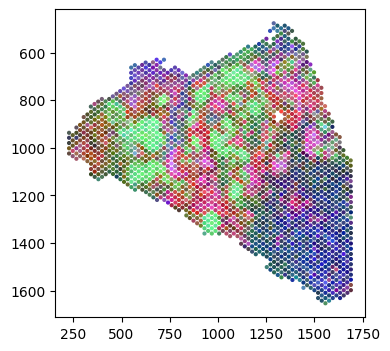

In [86]:
plt.figure(figsize=(4,4))
plt.scatter(raw_adata.obs['pixel_y'], raw_adata.obs['pixel_x'], marker='o', s=4, c=pca_hex_image)
plt.gca().invert_yaxis()

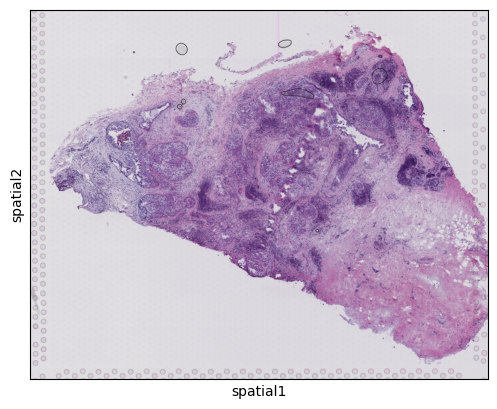

In [65]:
sc.pl.spatial(raw_adata)

### Write to simulation datapath

In [41]:
raw_adata

AnnData object with n_obs × n_vars = 2384 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'leiden', 'pixel_y', 'pixel_x', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'moranI', 'neighbors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'
    varm: 'PCs'
    obsp: 'connectivities', 'distances', 'spatial_connectivities', 'spatial_distances'

In [42]:
del raw_adata.obsp
del raw_adata.varm

In [43]:
raw_hires_img = raw_adata.uns['spatial'][library_id]['images']['hires']
if raw_hires_img.max()<1.1:
    raw_hires_img = (raw_hires_img*255).astype('uint8')
    raw_adata.uns['spatial'][library_id]['images']['hires'] = raw_hires_img

In [77]:
raw_adata.write_h5ad(simu_dataset_dir+'adata_simulation_raw.h5ad')

In [97]:
text_features.columns = raw_adata.obs.index

In [98]:
text_features.to_csv(simu_dataset_dir+'adata_simulation_text_features_raw.csv')

## Read raw simulation data

In [103]:
house_keeping_genes = pd.read_csv("/condo/wanglab/shared/wxc/clip/data/human/ST_data/housekeeping_genes.csv", index_col = 0)

In [104]:
k=50

In [105]:
raw_simu_adata = sc.read_h5ad(simu_dataset_dir+'adata_simulation_raw.h5ad')

In [106]:
raw_simu_adata

AnnData object with n_obs × n_vars = 2384 × 33538
    obs: 'in_tissue', 'array_row', 'array_col', 'leiden', 'pixel_y', 'pixel_x', 'cell_type'
    var: 'gene_ids', 'feature_types', 'genome', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'moranI', 'neighbors', 'pca', 'spatial', 'spatial_neighbors', 'umap'
    obsm: 'X_pca', 'X_umap', 'spatial'

In [107]:
library_id = get_library_id(raw_simu_adata)
scalef = raw_simu_adata.uns['spatial'][library_id]['scalefactors']['tissue_hires_scalef']
raw_hires_img = raw_simu_adata.uns['spatial'][library_id]['images']['hires']
height, width, channels = raw_hires_img.shape

# Pertub by noisy level

In [108]:
raw_simu_adata_coor = np.array(raw_simu_adata.obs[['pixel_y','pixel_x']])*scalef

In [109]:
raw_simu_adata.X = raw_simu_adata.X.todense()

In [110]:
mean_counts = raw_simu_adata.X.mean()

In [111]:
mean_counts

0.19646084

## Pertub func

In [123]:
def generate_simulation_data(raw_simu_adata, pertub, angle_degrees, cut_width):

    pc = pertub*mean_counts
    ad_pertub = simulate_gene_exp(raw_simu_adata, pc=pc)
    ad_pertub.write_h5ad(simu_dataset_dir+'adata_simulation_nb'+str("%.2f" % pertub)+'.h5ad')
    
    ad = ad_pertub.copy()
    ad = ad[:,~ad.var.index.str.contains('.',regex=False)]
    ad = ad[:,~ad.var.index.str.contains('-',regex=False)]
    ad = ad[:,~ad.var.index.isin(house_keeping_genes['genesymbol'])]
    expr = pd.DataFrame(ad.X, index=ad.obs.index + '_hires', columns=ad.var.index)
    top_k_genes = expr.apply(lambda s, n: pd.Series(s.nlargest(n).index), axis=1, n=k)
    top_k_genes_str = pd.DataFrame()
    top_k_genes_str['label'] = top_k_genes[top_k_genes.columns].astype(str).apply(lambda x: ' '.join(x), axis = 1)
    
    text_feature_path = os.path.join(simu_dataset_dir, 'adata_simulation_txt_features_nb_'+str("%.2f" % pertub)+'.csv')
    text_features = pd.DataFrame()
    warnings.simplefilter(action='ignore')
    for patch_idx in ad.obs.index:
        text = top_k_genes_str[top_k_genes_str.index==patch_idx + '_hires']['label'].values[0]
        text_input = tokenizer([text], context_length=76).to(DEVICE)
        with torch.no_grad():
            text_features[patch_idx] = model.encode_text(text_input).cpu().detach().numpy()[0] 
    text_features.to_csv(text_feature_path)    
    
    ad_pertub_coor, kept_indices, excluded_coords, transformation_matrix = rotate_and_mask_coordinates(raw_simu_adata_coor, angle_degrees, cut_width, height, width)
    ad_pertub_img = cv2.warpPerspective(raw_hires_img, transformation_matrix, (width, height))
    ad_pertub_img = mask_image_at_grid_coords(ad_pertub_img, excluded_coords.astype(int), region_size=30, mask_value=255)
    

    ad_pertub = ad_pertub[kept_indices,:]
    ad_pertub.obsm['spatial'] = ad_pertub_coor/scalef
    ad_pertub.obs[['pixel_y','pixel_x']] = ad_pertub_coor/scalef
    ad_pertub.uns['spatial'][library_id]['images']['hires'] = ad_pertub_img
    sc.pl.spatial(ad_pertub, color='in_tissue')
    ad_pertub_name = 'adata_simulation_nb'+str("%.2f" % pertub)+'_ang'+str("%.2f" % angle_degrees)+'_cut'+str("%.2f" % cut_width)+'.h5ad'
    ad_pertub_path = simu_dataset_dir+ad_pertub_name
    ad_pertub.write_h5ad(ad_pertub_path)

    return ad_pertub, ad_pertub_name

In [124]:
def generate_simulation_data_by_random_noise_para(level, cut_range, pertub_range, angle_range, n):
    ad_pertub_name_list = []
    for i in tqdm(range(n)):
        pertub = random.uniform(pertub_range[0], pertub_range[1])
        angle_degrees = random.uniform(angle_range[0], angle_range[1]) * [-1,1][random.randrange(2)]
        cut_width = random.uniform(cut_range[0], cut_range[1])
        _, ad_pertub_name = generate_simulation_data(raw_simu_adata, pertub, angle_degrees, cut_width)
        ad_pertub_name_list.append(ad_pertub_name)
        print(ad_pertub_name)
    pd.DataFrame(ad_pertub_name_list).to_csv(simu_dataset_dir+level+'_noisy_simulation_data_names.csv',index=None, header=None)

In [25]:
tokenizer = get_tokenizer('coca_ViT-L-14')
model_dir = "2024_03_25-19_46_42-model_coca_ViT-L-14-lr_5e-06-b_64-j_8-p_amp"
epoch_n = "epoch_20.pt"
model_path = os.path.join("/condo/wanglab/shared/wxc/clip/models/open_clip-main/logs", model_dir, "checkpoints", epoch_n)
model, preprocess = create_model_from_pretrained("coca_ViT-L-14", device = DEVICE, pretrained=model_path)

In [125]:
n = 1

## Lowly noisy

In [33]:
level = 'lowly'
cut_range = (0.005, 0.03)
pertub_range = (0.005, 0.05)
angle_range = (0.5, 5)

  0%|          | 0/5 [00:00<?, ?it/s]

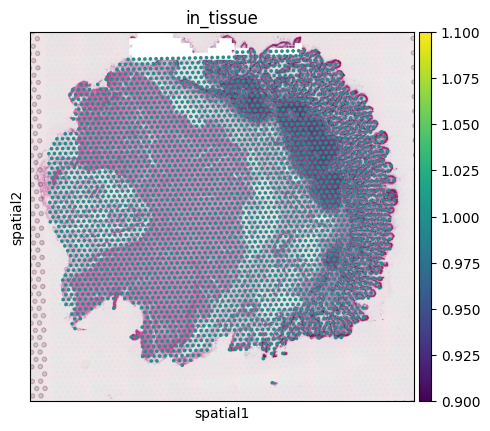

 20%|██        | 1/5 [00:34<02:18, 34.63s/it]

/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.03_ang-1.25_cut0.02.h5ad


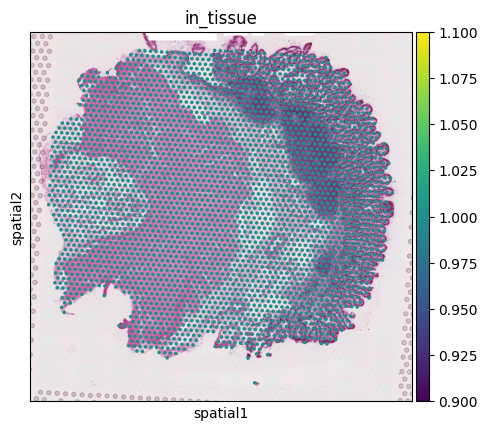

 40%|████      | 2/5 [01:08<01:43, 34.37s/it]

/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.03_ang3.65_cut0.02.h5ad


In [ ]:
generate_simulation_data_by_random_noise_para(level, cut_range, pertub_range, angle_range, n)

## Medium noisy

In [45]:
level = 'medium'
cut_range = (0.03, 0.1)
pertub_range = (0.05, 0.25)
angle_range = (5, 15)

  0%|          | 0/5 [00:00<?, ?it/s]

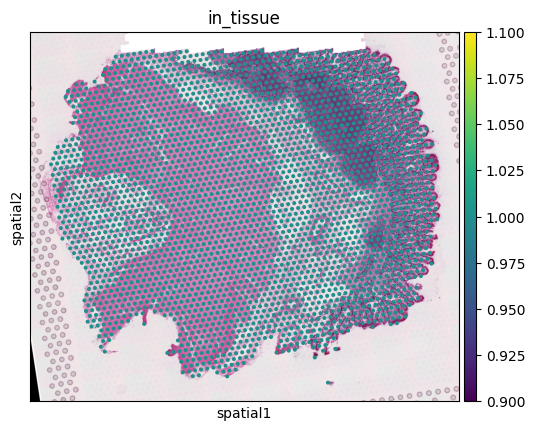

 20%|██        | 1/5 [00:33<02:15, 33.99s/it]

/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.18_ang-8.73_cut0.07.h5ad


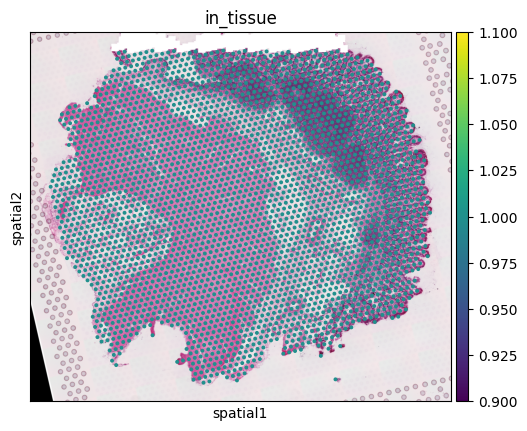

 40%|████      | 2/5 [01:08<01:42, 34.04s/it]

/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.17_ang-12.90_cut0.04.h5ad


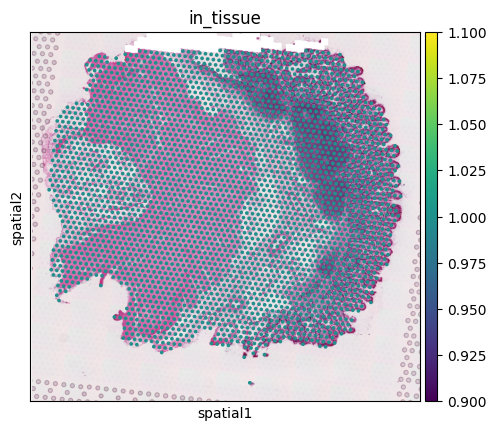

 60%|██████    | 3/5 [01:43<01:09, 34.56s/it]

/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.23_ang6.70_cut0.04.h5ad


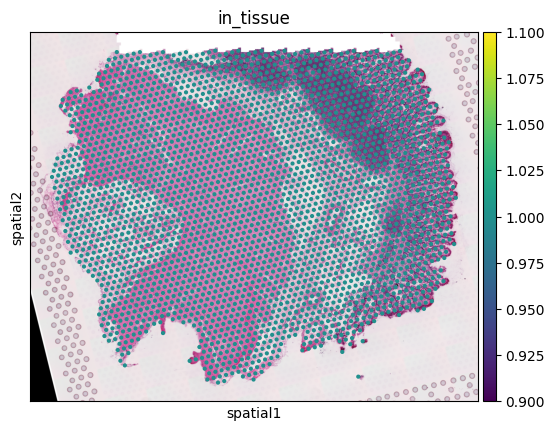

 80%|████████  | 4/5 [02:17<00:34, 34.29s/it]

/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.14_ang-13.87_cut0.09.h5ad


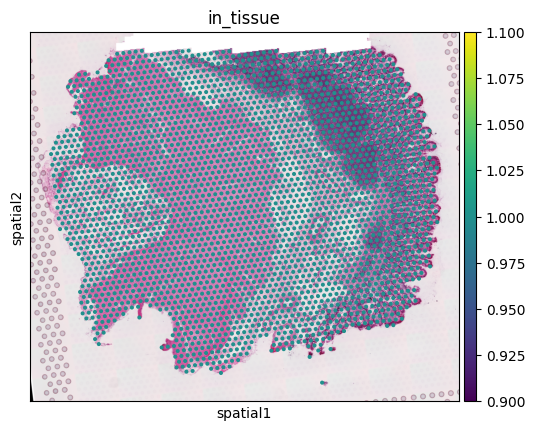

100%|██████████| 5/5 [02:50<00:00, 34.19s/it]

/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.14_ang-6.83_cut0.08.h5ad


In [46]:
generate_simulation_data_by_random_noise_para(level, cut_range, pertub_range, angle_range, n)

## Highly noisy

In [101]:
level = 'highly'
cut_range = (0.1, 0.2)
pertub_range = (0.25, 0.50)
angle_range = (15, 30)

  0%|          | 0/1 [00:00<?, ?it/s]

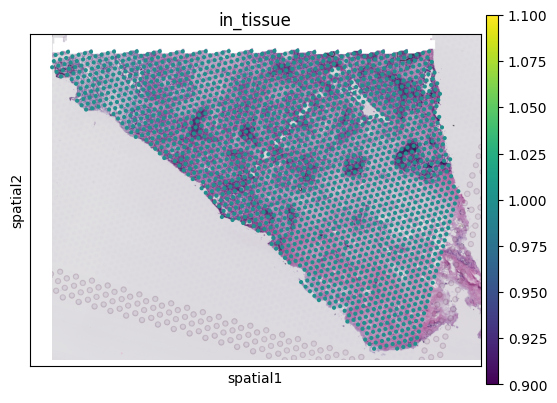

100%|██████████| 1/1 [00:24<00:00, 24.79s/it]

adata_simulation_nb0.35_ang15.83_cut0.17.h5ad


In [126]:
generate_simulation_data_by_random_noise_para(level, cut_range, pertub_range, angle_range, n)

# Test simulation data

In [22]:
result_dir = simu_dataset_dir+'omiclip_results/'
if not os.path.exists(result_dir):
    os.makedirs(result_dir)

## ST to ST

In [159]:
def align_st_to_st(src_sample_name):    
    ad_src = sc.read_h5ad(simu_dataset_dir+src_sample_name)
    ad_src_coor = np.array(ad_src.obs[['pixel_y','pixel_x']])*scalef
    
    src_img = ad_src.uns['spatial'][library_id]['images']['hires']
    
    src_features = pd.read_csv(os.path.join(simu_dataset_dir, 'adata_simulation_txt_features_nb_'+str(src_sample_name[19:23])+'.csv'), index_col=0)
    src_features = src_features[ad_src.obs.index]
    
    comb_features = pd.concat([src_features,tar_features],axis=1)
    pca_image_fearures = pca.fit_transform(comb_features.T)
    pca_rgb_image = (pca_image_fearures-pca_image_fearures.min(axis=0))/(pca_image_fearures.max(axis=0)-pca_image_fearures.min(axis=0))
    pca_hex_image = [ rgb2hex(pca_rgb_image[i,:]) for i in range(pca_rgb_image.shape[0]) ]

    ad_tar_coor_z = (ad_tar_coor-ad_tar_coor.min(axis=0))/(ad_tar_coor.max(axis=0)-ad_tar_coor.min(axis=0))
    ad_src_coor_z = (ad_src_coor-ad_src_coor.min(axis=0))/(ad_src_coor.max(axis=0)-ad_src_coor.min(axis=0))
    
    pca_image_fearures_z = pca_image_fearures.copy()
    pca_image_fearures_z[len(src_features.T):,:] = (pca_image_fearures_z[len(src_features.T):,:]-pca_image_fearures_z[len(src_features.T):,:].min(axis=0))/(pca_image_fearures_z[len(src_features.T):,:].max(axis=0)-pca_image_fearures_z[len(src_features.T):,:].min(axis=0))
    pca_image_fearures_z[:len(src_features.T),:] = (pca_image_fearures_z[:len(src_features.T),:]-pca_image_fearures_z[:len(src_features.T),:].min(axis=0))/(pca_image_fearures_z[:len(src_features.T),:].max(axis=0)-pca_image_fearures_z[:len(src_features.T),:].min(axis=0))
    
    target = np.concatenate((ad_tar_coor_z, pca_image_fearures_z[len(src_features.T):,:2]), axis=1)
    source = np.concatenate((ad_src_coor_z, pca_image_fearures_z[:len(src_features.T),:2]), axis=1)
    
    reg = DeformableRegistration(X=target, Y=source, low_rank=True,
                                 alpha=100, max_iterations=int(1e9), tolerance=1e-9)
    TY = reg.register()[0]
    TY=((TY-TY.min())/(TY.max()-TY.min()))[:,:2]

    points1 = TY*(ad_tar_coor.max(axis=0)-ad_tar_coor.min(axis=0))+ad_tar_coor.min(axis=0)
    
    # h, mask = cv2.findHomography(ad_src_coor, points1, cv2.RANSAC, 20)
    h = find_homography_translation_rotation(ad_src_coor, points1)
    pst = apply_homography(ad_src_coor, h)
    aligned_image = cv2.warpPerspective(src_img, h, (src_img.shape[1], src_img.shape[0]))
    
    plt.figure(figsize=(10, 8))
    plt.subplot(1, 3, 1)
    plt.scatter(ad_tar_coor[:,0], ad_tar_coor[:,1], marker='o', alpha=0.8, s=1, c=pca_hex_image[len(src_features.T):])
    plt.imshow(tar_img, origin='lower', alpha=0.3)
    
    plt.subplot(1, 3, 2)
    plt.scatter(ad_src_coor[:,0], ad_src_coor[:,1], marker='o', alpha=0.8, s=1,c=pca_hex_image[:len(src_features.T)])
    plt.imshow(src_img, origin='lower', alpha=0.3)

    plt.subplot(1, 3, 3)
    plt.scatter(ad_tar_coor[:,0], ad_tar_coor[:,1], marker='o', alpha=0.2, s=1, c=pca_hex_image[len(src_features.T):])
    plt.scatter(pst[:,0], pst[:,1], marker='+', s=1, c=pca_hex_image[:len(src_features.T)])
    plt.imshow(aligned_image, origin='lower', alpha=0.3)
    
    plt.savefig(result_dir+src_sample_name[:-5]+'_st_to_st.pdf')
    plt.show()
    
    shared_indices = find_matching_indices(ad_tar.obs.index.tolist(), ad_src.obs.index.tolist())
    dist_homo = np.mean(np.sqrt(np.sum(np.square(ad_tar_coor[shared_indices[:,0]] - pst[shared_indices[:,1]]), axis=1)))
    dist_raw = np.mean(np.sqrt(np.sum(np.square(ad_tar_coor[shared_indices[:,0]] - points1[shared_indices[:,1]]), axis=1)))

    return dist_raw, dist_homo

In [158]:
tar_sample_name = 'adata_simulation_raw.h5ad'
ad_tar = sc.read_h5ad(os.path.join(simu_dataset_dir, tar_sample_name))
tar_img = ad_tar.uns['spatial'][library_id]['images']['hires']
ad_tar_coor = np.array(ad_tar.obs[['pixel_y','pixel_x']])*scalef

tar_features = pd.read_csv(os.path.join(simu_dataset_dir, 'adata_simulation_text_features_raw.csv'), index_col=0)
tar_features = tar_features[ad_tar.obs.index]

### lowly noisy

In [25]:
level = 'lowly'

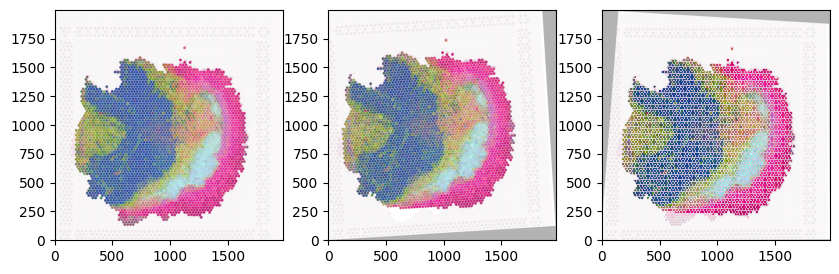

6.173203532994913 4.9240937793631305


<Figure size 640x480 with 0 Axes>

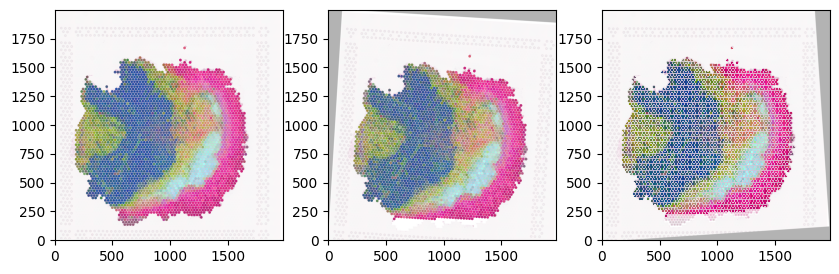

4.780133991882068 3.339985928211615


<Figure size 640x480 with 0 Axes>

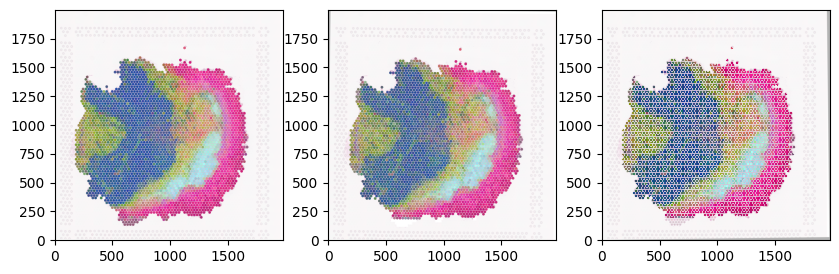

3.22571113764057 1.8278537940189439


<Figure size 640x480 with 0 Axes>

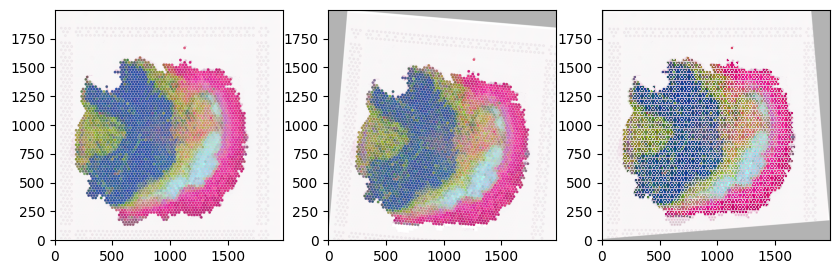

5.567318357539029 5.027297373460381


<Figure size 640x480 with 0 Axes>

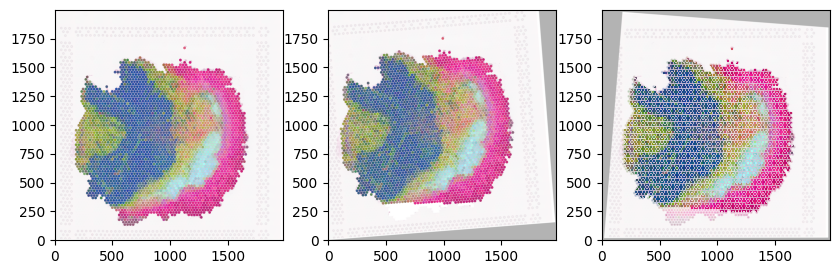

12.268620653606188 10.192707701586047


<Figure size 640x480 with 0 Axes>

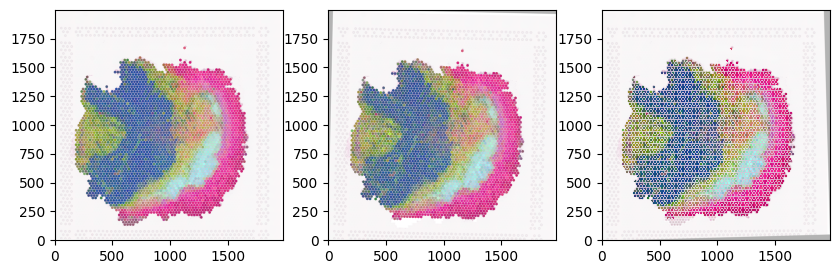

3.388924111136389 1.73372525733668


<Figure size 640x480 with 0 Axes>

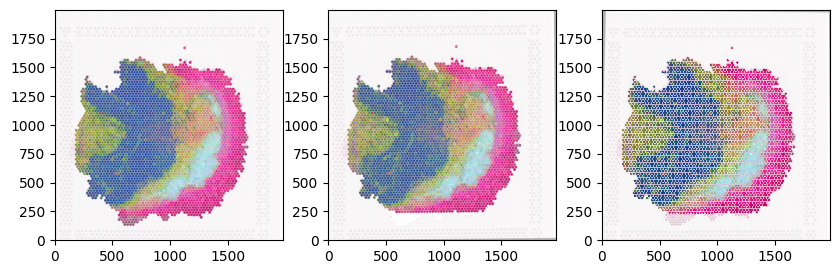

4.766435316531914 3.1383243033867823


<Figure size 640x480 with 0 Axes>

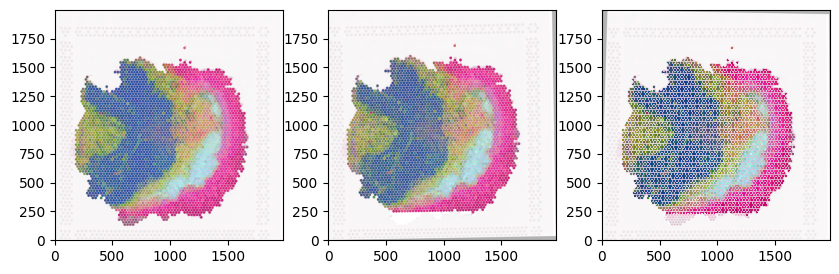

4.566756137736081 2.8120015899477617


<Figure size 640x480 with 0 Axes>

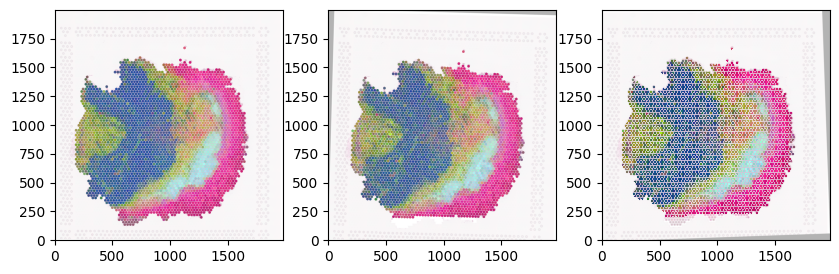

3.9567006253246095 2.316845850676991


<Figure size 640x480 with 0 Axes>

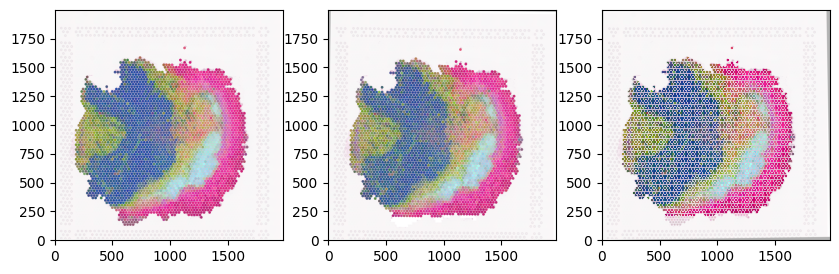

4.7182212315342085 3.3374393518415624


<Figure size 640x480 with 0 Axes>

In [37]:
all_dist = pd.DataFrame()
ad_pertub_name_list = pd.read_csv(simu_dataset_dir+level+'_noisy_simulation_data_names.csv', header=None)

for src_sample_name in ad_pertub_name_list[0]:
    dist_raw, dist_homo = align_st_to_st(src_sample_name)
    print(dist_raw, dist_homo)
    all_dist.loc[src_sample_name,'dist_raw'] = dist_raw
    all_dist.loc[src_sample_name,'dist_homo'] = dist_homo
    all_dist.to_csv(result_dir+level+'_noisy_omiclip_aligned_st_to_st_distance.csv')

In [38]:
all_dist

,dist_raw,dist_homo
/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.03_ang3.53_cut0.02.h5ad,6.173204,4.924094
/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.01_ang-3.53_cut0.02.h5ad,4.780134,3.339986
/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.01_ang-0.65_cut0.01.h5ad,3.225711,1.827854
/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.04_ang-4.86_cut0.01.h5ad,5.567318,5.027297
/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.01_ang4.45_cut0.03.h5ad,12.268621,10.192708
/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.02_ang-1.27_cut0.01.h5ad,3.388924,1.733725
/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.03_ang0.54_cut0.02.h5ad,4.766435,3.138324
/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.03_ang1.01_cut0.02.h5ad,4.566756,2.812002
/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.02_ang-1.59_cut0.01.h5ad,3.956701,2.316846
/condo/wanglab/shared/wxc/clip/data/human/ST_data/simulation_data/data31_spatial_fresh_frozen_35sample_V19T26-028_C1/adata_layer_1_nb0.04_ang-0.70_cut0.01.h5ad,4.718221,3.337439


### Medium noisy

In [27]:
level = 'medium'

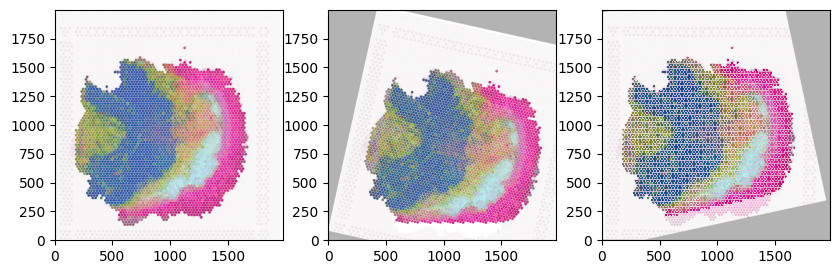

6.54506446112516 3.0546957293859447


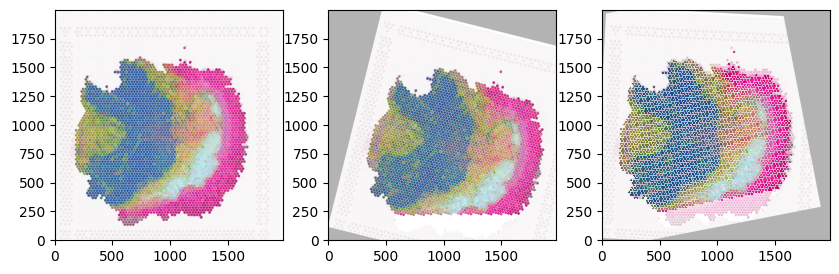

38.3463226276001 38.78748572166372


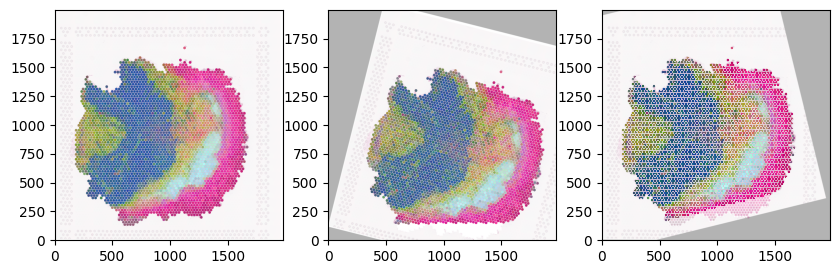

7.064486820365194 2.8572899133327967


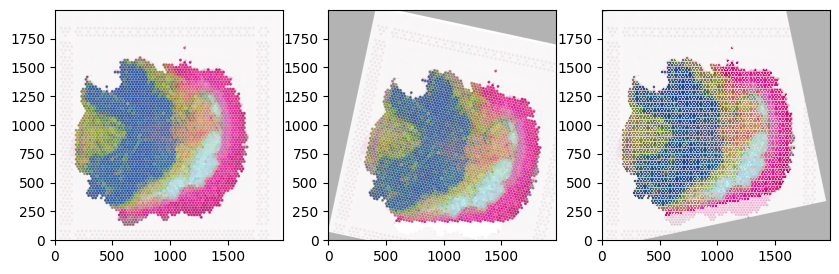

7.580327968073368 4.719654755708273


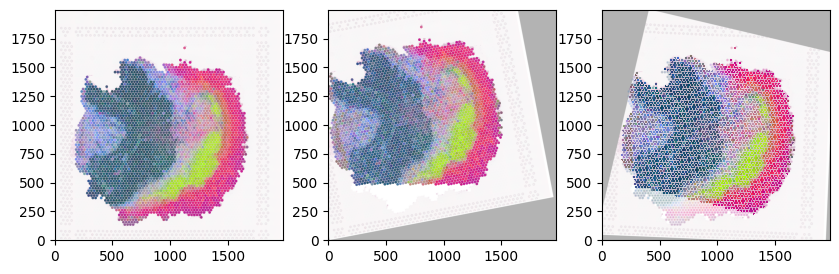

42.197249587339286 20.622766852599902


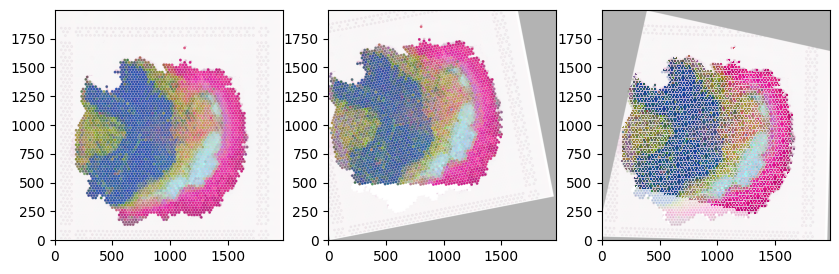

35.657711020806936 13.040470241328778


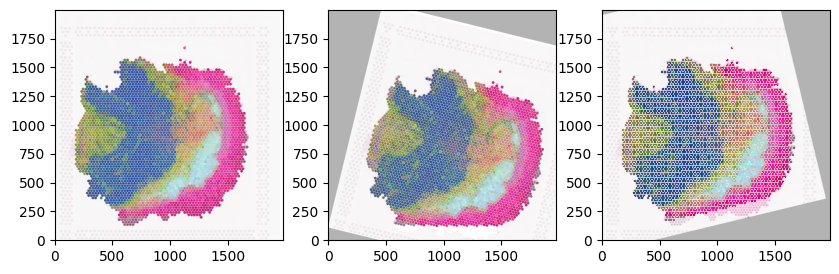

5.5972068983267125 3.532463492425925


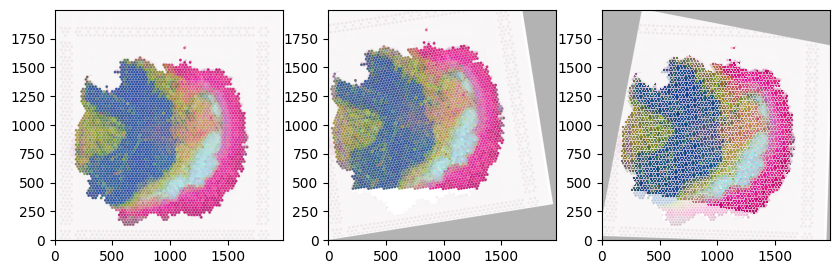

34.52542248318143 16.09392438872969


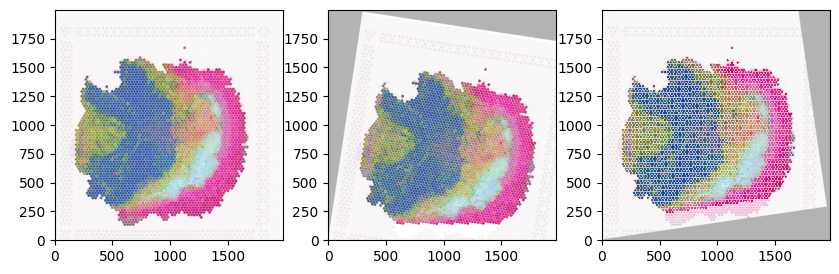

6.9465282942227 3.151325755784401


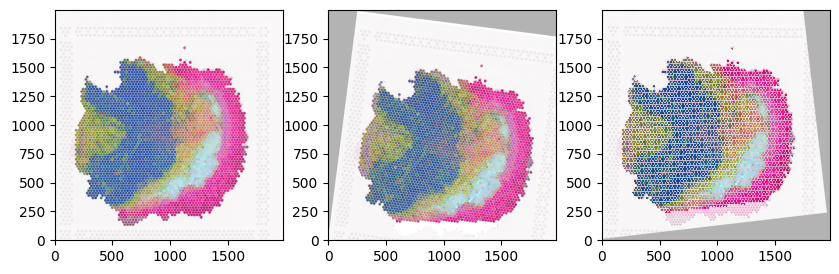

9.268482519171812 6.855126328164815


In [28]:
all_dist = pd.DataFrame()
ad_pertub_name_list = pd.read_csv(simu_dataset_dir+level+'_noisy_simulation_data_names.csv', header=None)

for src_sample_name in ad_pertub_name_list[0]:
    dist_raw, dist_homo = align_st_to_st(src_sample_name)
    print(dist_raw, dist_homo)
    all_dist.loc[src_sample_name,'dist_raw'] = dist_raw
    all_dist.loc[src_sample_name,'dist_homo'] = dist_homo
    all_dist.to_csv(result_dir+level+'_noisy_omiclip_aligned_st_to_st_distance.csv')

### Highly noisy

In [137]:
level = 'highly'

  0%|          | 0/1 [00:00<?, ?it/s]

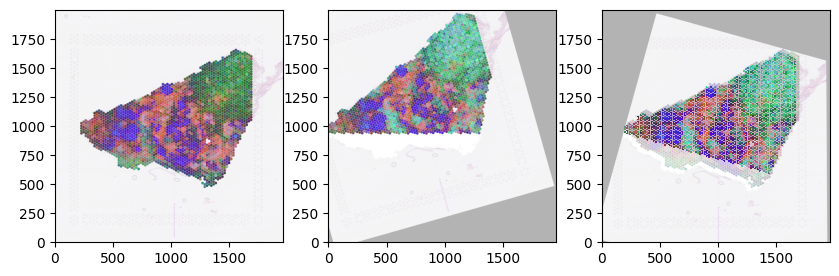

100%|██████████| 1/1 [00:23<00:00, 23.49s/it]

52.08193210692965 39.44274460900795


In [157]:
all_dist = pd.DataFrame()
ad_pertub_name_list = pd.read_csv(simu_dataset_dir+level+'_noisy_simulation_data_names.csv', header=None)

for src_sample_name in tqdm(ad_pertub_name_list[0]):
    dist_raw, dist_homo = align_st_to_st(src_sample_name)
    print(dist_raw, dist_homo)
    all_dist.loc[src_sample_name,'dist_raw'] = dist_raw
    all_dist.loc[src_sample_name,'dist_homo'] = dist_homo
    all_dist.to_csv(result_dir+level+'_noisy_omiclip_aligned_st_to_st_distance.csv')

## Img to ST

In [23]:
def align_img_to_st(src_sample_name):
    
    tar_features = pd.read_csv(os.path.join(simu_dataset_dir, 'adata_simulation_txt_features_nb_'+str(src_sample_name[19:23])+'_finetune10.csv'), index_col=0)
    tar_features = tar_features[ad_tar.obs.index]
    
    ad_src = sc.read_h5ad(simu_dataset_dir+src_sample_name)
    ad_src_coor = np.array(ad_src.obs[['pixel_y','pixel_x']])*scalef
    
    src_img = ad_src.uns['spatial'][library_id]['images']['hires']
    
    src_features = pd.read_csv(os.path.join(simu_dataset_dir, 'adata_simulation_img_features_finetune10.csv'), index_col=0)
    src_features = src_features[ad_src.obs.index]
    
    comb_features = pd.concat([src_features,tar_features],axis=1)
    pca_image_fearures = pca.fit_transform(comb_features.T)
    pca_rgb_image = (pca_image_fearures-pca_image_fearures.min(axis=0))/(pca_image_fearures.max(axis=0)-pca_image_fearures.min(axis=0))
    pca_hex_image = [ rgb2hex(pca_rgb_image[i,:]) for i in range(pca_rgb_image.shape[0]) ]

    ad_tar_coor_z = (ad_tar_coor-ad_tar_coor.min(axis=0))/(ad_tar_coor.max(axis=0)-ad_tar_coor.min(axis=0))
    ad_src_coor_z = (ad_src_coor-ad_src_coor.min(axis=0))/(ad_src_coor.max(axis=0)-ad_src_coor.min(axis=0))
    
    pca_image_fearures_z = pca_image_fearures.copy()
    pca_image_fearures_z[len(src_features.T):,:] = (pca_image_fearures_z[len(src_features.T):,:]-pca_image_fearures_z[len(src_features.T):,:].min(axis=0))/(pca_image_fearures_z[len(src_features.T):,:].max(axis=0)-pca_image_fearures_z[len(src_features.T):,:].min(axis=0))
    pca_image_fearures_z[:len(src_features.T),:] = (pca_image_fearures_z[:len(src_features.T),:]-pca_image_fearures_z[:len(src_features.T),:].min(axis=0))/(pca_image_fearures_z[:len(src_features.T),:].max(axis=0)-pca_image_fearures_z[:len(src_features.T),:].min(axis=0))
    
    target = np.concatenate((ad_tar_coor_z, pca_image_fearures_z[len(src_features.T):,:2]), axis=1)
    source = np.concatenate((ad_src_coor_z, pca_image_fearures_z[:len(src_features.T),:2]), axis=1)
    
    reg = DeformableRegistration(X=target, Y=source, low_rank=True,
                                 alpha=100, max_iterations=int(1e9), tolerance=1e-9)
    TY = reg.register()[0]
    TY=((TY-TY.min())/(TY.max()-TY.min()))[:,:2]

    points1 = TY*(ad_tar_coor.max(axis=0)-ad_tar_coor.min(axis=0))+ad_tar_coor.min(axis=0)
   
    # h, mask = cv2.findHomography(ad_src_coor, points1, cv2.RANSAC, 20)
    h = find_homography_translation_rotation(ad_src_coor, points1)
    pst = apply_homography(ad_src_coor, h)
    aligned_image = cv2.warpPerspective(src_img, h, (src_img.shape[1], src_img.shape[0]))

    plt.figure(figsize=(10, 8))
    plt.subplot(1, 3, 1)
    plt.scatter(ad_tar_coor[:,0], ad_tar_coor[:,1], marker='o', alpha=0.8, s=1, c=pca_hex_image[len(src_features.T):])
    plt.imshow(tar_img, origin='lower', alpha=0.3)
    
    plt.subplot(1, 3, 2)
    plt.scatter(ad_src_coor[:,0], ad_src_coor[:,1], marker='o', alpha=0.8, s=1,c=pca_hex_image[:len(src_features.T)])
    plt.imshow(src_img, origin='lower', alpha=0.3)

    plt.subplot(1, 3, 3)
    plt.scatter(ad_tar_coor[:,0], ad_tar_coor[:,1], marker='o', alpha=0.2, s=1, c=pca_hex_image[len(src_features.T):])
    plt.scatter(pst[:,0], pst[:,1], marker='+', s=1, c=pca_hex_image[:len(src_features.T)])
    plt.imshow(aligned_image, origin='lower', alpha=0.3)
    plt.show()
    plt.savefig(result_dir+src_sample_name[:-5]+'_img_to_st.pdf')
    
    shared_indices = find_matching_indices(ad_tar.obs.index.tolist(), ad_src.obs.index.tolist())
    dist_homo = np.mean(np.sqrt(np.sum(np.square(ad_tar_coor[shared_indices[:,0]] - pst[shared_indices[:,1]]), axis=1)))
    dist_raw = np.mean(np.sqrt(np.sum(np.square(ad_tar_coor[shared_indices[:,0]] - points1[shared_indices[:,1]]), axis=1)))

    return dist_raw, dist_homo

In [161]:
tar_sample_name = 'adata_simulation_raw.h5ad'
ad_tar = sc.read_h5ad(os.path.join(simu_dataset_dir, tar_sample_name))
tar_img = ad_tar.uns['spatial'][library_id]['images']['hires']
ad_tar_coor = np.array(ad_tar.obs[['pixel_y','pixel_x']])*scalef

### Generate data for finetune

In [20]:
datapath='/condo/wanglab/shared/wxc/clip/data/human/ST_data/all_top50_heg_remove_dots_dash_hk_genes_no_comma_train_2157867.csv'
DATAFRAME = pd.read_csv(datapath,index_col=0)
target_df=DATAFRAME[DATAFRAME['sample_name'].isin([raw_data_name])]
target_df['img_path']='/condo/wanglab/shared/wxc/clip/data/human/ST_data/images/patches/'+target_df['img_idx']+'.png'
target_df

/tmp/ipykernel_2301991/281167699.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  target_df['img_path']='/condo/wanglab/shared/wxc/clip/data/human/ST_data/images/patches/'+target_df['img_idx']+'.png'


,label,sample_name,dataset,img_idx,img_path
10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BRCA0_Vis_processed_data_AAACACCAATAACTGC-1,IGKC SERF2 RPL10 CTSD LY6E FAU IGHG3 BLVRB IGL...,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,data21_Breast_adenocarcinoma_3sample,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BRCA0_Vis_processed_data_AAACAGTGTTCCTGGG-1,IGKC IGLC3 CTSD IGLC2 FAU RPL10 KRT8 IGHG4 IGH...,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,data21_Breast_adenocarcinoma_3sample,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BRCA0_Vis_processed_data_AAACATTTCCCGGATT-1,IGKC IGHM TIMP1 RPL15 EDF1 FAU KRT8 ITM2B IGHA...,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,data21_Breast_adenocarcinoma_3sample,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BRCA0_Vis_processed_data_AAACCGGGTAGGTACC-1,IGKC TAGLN SERF2 RPL36 KRT17 CTSD IGHM RPL10 I...,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,data21_Breast_adenocarcinoma_3sample,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BRCA0_Vis_processed_data_AAACCGTTCGTCCAGG-1,IGKC RPL10 SERF2 RPL36 FAU MYL6 RPL30 IGLC3 CT...,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,data21_Breast_adenocarcinoma_3sample,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
...,...,...,...,...,...
10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BRCA0_Vis_processed_data_TTGTTTCACATCCAGG-1,IGKC IGLC3 IGLC2 IGHG1 RPL10 RPL36 MDK IGHG4 I...,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,data21_Breast_adenocarcinoma_3sample,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BRCA0_Vis_processed_data_TTGTTTCATTAGTCTA-1,IGKC FAU IGHG3 ARHGAP4 RPL10 ADIRF NOTCH3 RPS1...,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,data21_Breast_adenocarcinoma_3sample,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BRCA0_Vis_processed_data_TTGTTTCCATACAACT-1,IGKC COL1A1 RPL10 RPS12 RPL15 IGHG3 COL6A1 COL...,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,data21_Breast_adenocarcinoma_3sample,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...
10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BRCA0_Vis_processed_data_TTGTTTGTATTACACG-1,IGKC SERF2 IGLC2 LY6E IGHG3 TAGLN KRT8 IGLC3 S...,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,data21_Breast_adenocarcinoma_3sample,10X_Visium_Barkley2022Cancer_GSM6177599_NYU_BR...,/condo/wanglab/shared/wxc/clip/data/human/ST_d...


In [21]:
target_df.to_csv(raw_dataset_dir+raw_data_name+'_training_df.csv')

### Generate finetune feature

In [ ]:
def generate_finetune_text_features(pertub_data_name):
    ad = sc.read_h5ad(simu_dataset_dir+pertub_data_name)
    ad = ad[:,~ad.var.index.str.contains('.',regex=False)]
    ad = ad[:,~ad.var.index.str.contains('-',regex=False)]
    ad = ad[:,~ad.var.index.isin(house_keeping_genes['genesymbol'])]
    expr = pd.DataFrame(ad.X, index=ad.obs.index + '_hires', columns=ad.var.index)
    top_k_genes = expr.apply(lambda s, n: pd.Series(s.nlargest(n).index), axis=1, n=k)
    top_k_genes_str = pd.DataFrame()
    top_k_genes_str['label'] = top_k_genes[top_k_genes.columns].astype(str).apply(lambda x: ' '.join(x), axis = 1)
    
    text_feature_path = os.path.join(simu_dataset_dir, 'adata_simulation_txt_features_nb_'+str(pertub_data_name[[19:23])+'_finetune10.csv')
    text_features = pd.DataFrame()
    warnings.simplefilter(action='ignore')
    for patch_idx in ad.obs.index:
    
        text = top_k_genes_str[top_k_genes_str.index==patch_idx + '_hires']['label'].values[0]
        text_input = tokenizer([text], context_length=76).to(DEVICE)
        with torch.no_grad():
            text_features[patch_idx] = model.encode_text(text_input).cpu().detach().numpy()[0]
    
    text_features.to_csv(text_feature_path)

In [102]:
tokenizer = get_tokenizer('coca_ViT-L-14')
model_dir = "2024_07_30-13_44_39-model_coca_ViT-L-14-lr_5e-06-b_64-j_8-p_amp"
epoch_n = "epoch_10.pt"
model_path = os.path.join("/condo/wanglab/shared/wxc/clip/models/open_clip-main/logs", model_dir, "checkpoints", epoch_n)
model, preprocess = create_model_from_pretrained("coca_ViT-L-14", device = DEVICE, pretrained=model_path)

In [ ]:
image_feature_path = os.path.join(simu_dataset_dir, 'adata_simulation_img_features_finetune10.csv')
image_features = pd.DataFrame()
warnings.simplefilter(action='ignore')
for patch_idx in tqdm(ad_tar.obs.index):
    image = Image.open(os.path.join(PATCH_DIR, patch_idx+'_hires.png'))
    image_input = torch.stack([preprocess(image)]).to(DEVICE)
    with torch.no_grad():
        image_features[patch_idx] = model.encode_image(image_input).cpu().detach().numpy()[0]

image_features.to_csv(image_feature_path)

In [103]:
level = 'lowly'
ad_pertub_name_list = pd.read_csv(simu_dataset_dir+level+'_noisy_simulation_data_names.csv', header=None)
for pertub_data_name in tqdm(ad_pertub_name_list[0]):
    generate_finetune_text_features(pertub_data_name)

100%|██████████| 10/10 [04:47<00:00, 28.72s/it]


In [104]:
level = 'medium'
ad_pertub_name_list = pd.read_csv(simu_dataset_dir+level+'_noisy_simulation_data_names.csv', header=None)
for name in tqdm(ad_pertub_name_list[0]):
    generate_finetune_text_features(pertub_data_name)

100%|██████████| 10/10 [04:47<00:00, 28.79s/it]


In [105]:
level = 'highly'
ad_pertub_name_list = pd.read_csv(simu_dataset_dir+level+'_noisy_simulation_data_names.csv', header=None)
for name in tqdm(ad_pertub_name_list[0]):
    generate_finetune_text_features(pertub_data_name)

100%|██████████| 10/10 [04:50<00:00, 29.02s/it]


### lowly noisy

In [26]:
level = 'lowly'

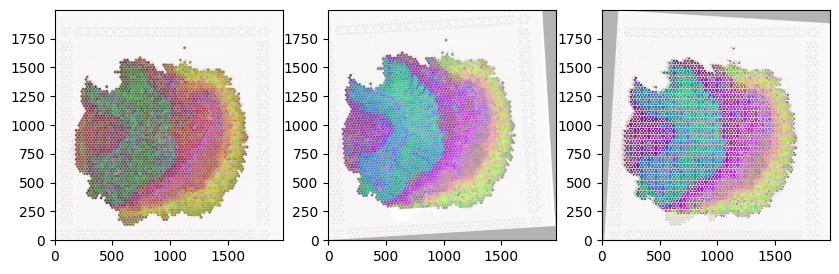

26.877514081534553 20.267907797253034


<Figure size 640x480 with 0 Axes>

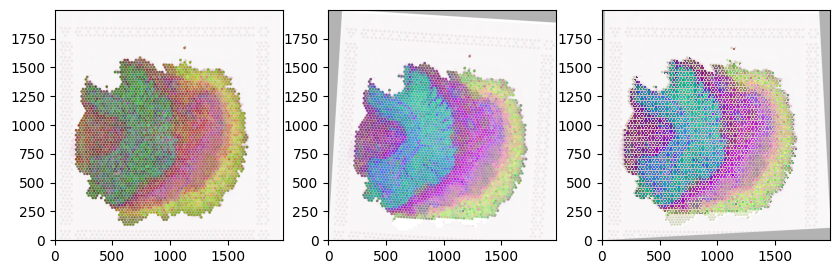

24.68949440882779 18.645536968297073


<Figure size 640x480 with 0 Axes>

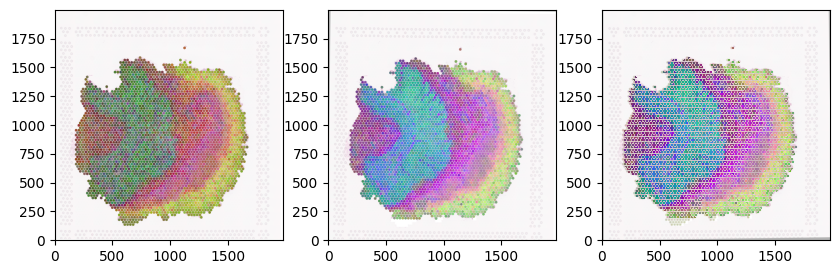

20.57521068839172 14.168339258142307


<Figure size 640x480 with 0 Axes>

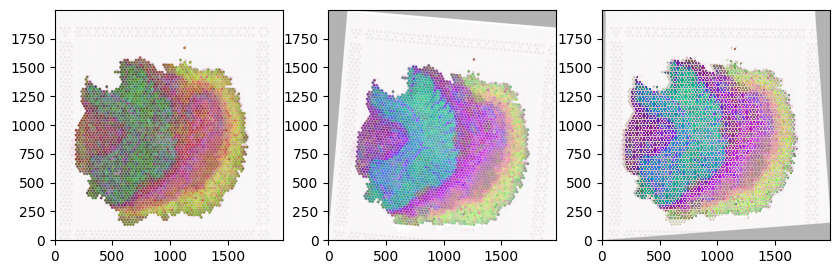

30.672966860878912 24.327778506571327


<Figure size 640x480 with 0 Axes>

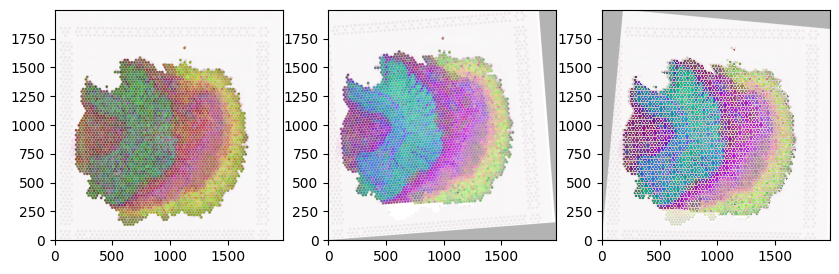

25.02551119915462 16.39369094851888


<Figure size 640x480 with 0 Axes>

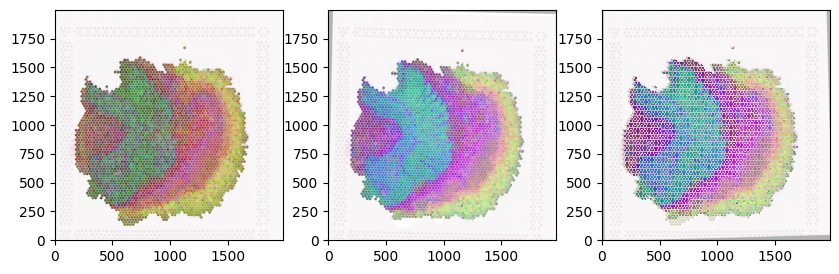

25.90323568175649 20.051244704668147


<Figure size 640x480 with 0 Axes>

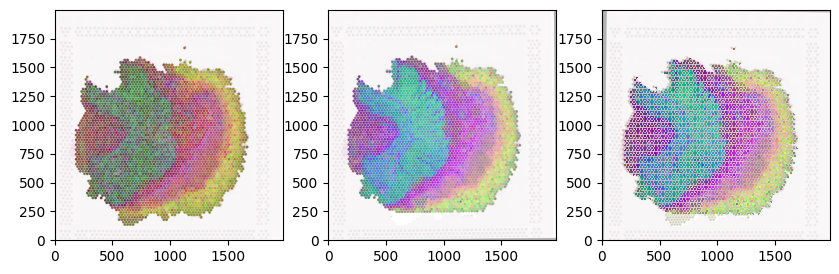

28.436592700365708 21.850422241764498


<Figure size 640x480 with 0 Axes>

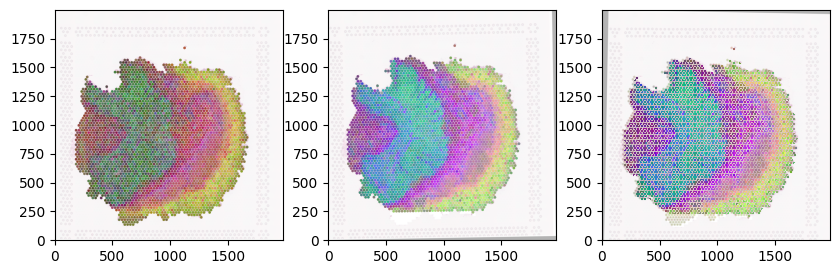

28.001775179706417 21.49694703250421


<Figure size 640x480 with 0 Axes>

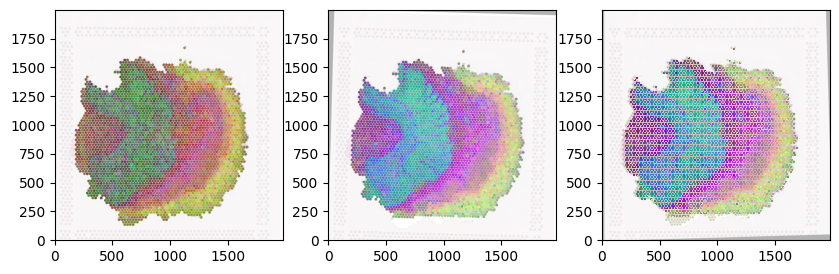

27.833734383275555 22.09148956967722


<Figure size 640x480 with 0 Axes>

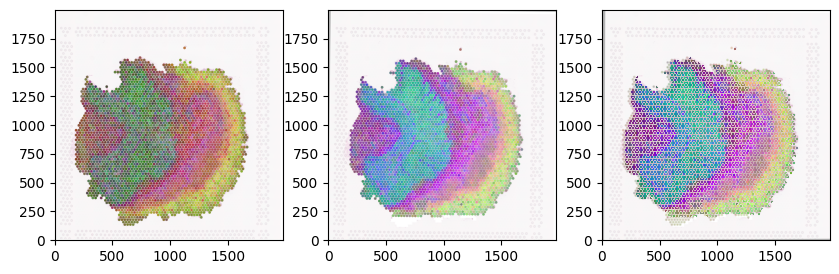

30.344385858684284 24.199515813259673


<Figure size 640x480 with 0 Axes>

In [27]:
all_dist = pd.DataFrame()
ad_pertub_name_list = pd.read_csv(simu_dataset_dir+level+'_noisy_simulation_data_names.csv', header=None)

for src_sample_name in ad_pertub_name_list[0]:
    dist_raw, dist_homo = align_img_to_st(src_sample_name)
    print(dist_raw, dist_homo)
    all_dist.loc[src_sample_name,'dist_raw'] = dist_raw
    all_dist.loc[src_sample_name,'dist_homo'] = dist_homo
    all_dist.to_csv(result_dir+level+'_noisy_omiclip_aligned_img_to_st_distance.csv')

### medium noisy

In [28]:
level = 'medium'

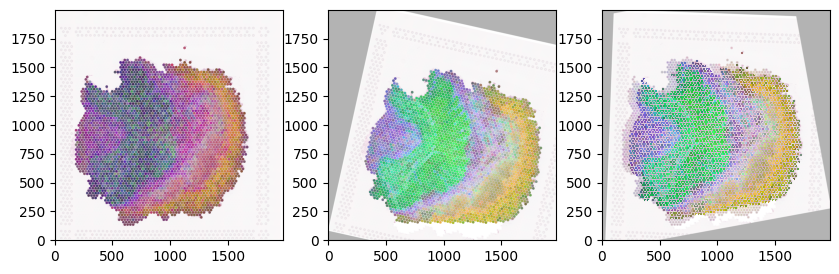

98.6035857986755 72.93812266335964


<Figure size 640x480 with 0 Axes>

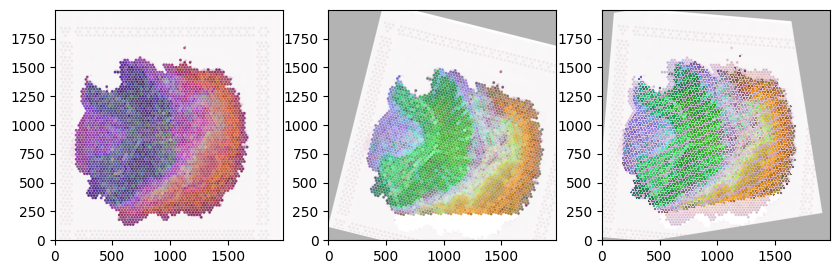

86.45333604590353 59.845259282760914


<Figure size 640x480 with 0 Axes>

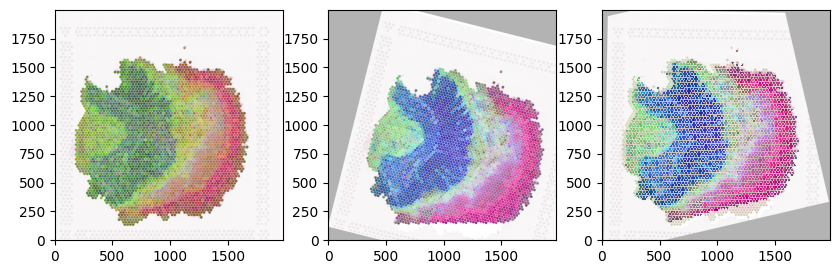

46.00386072267352 38.603934945067394


<Figure size 640x480 with 0 Axes>

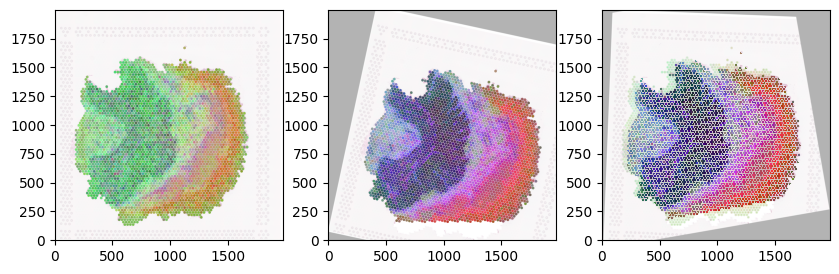

87.72020503781859 63.61961634958554


<Figure size 640x480 with 0 Axes>

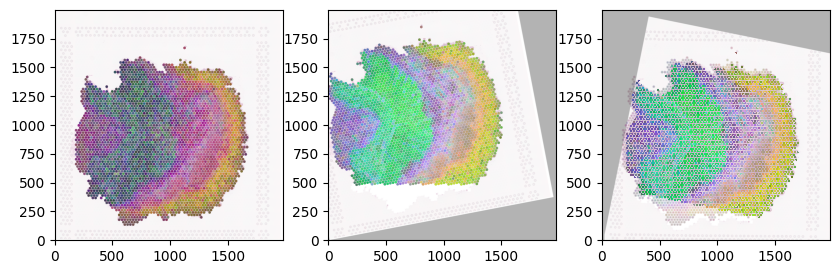

73.03869858142967 49.93891132889583


<Figure size 640x480 with 0 Axes>

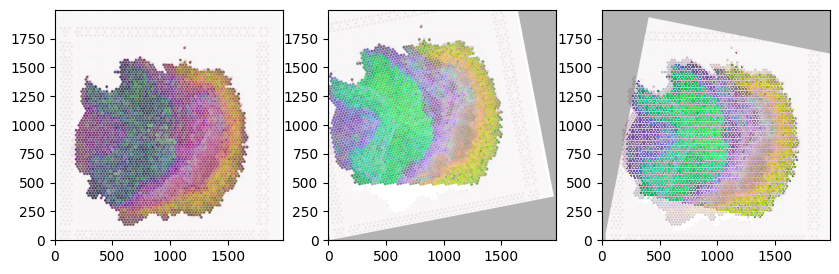

75.59708790236266 54.90679418283408


<Figure size 640x480 with 0 Axes>

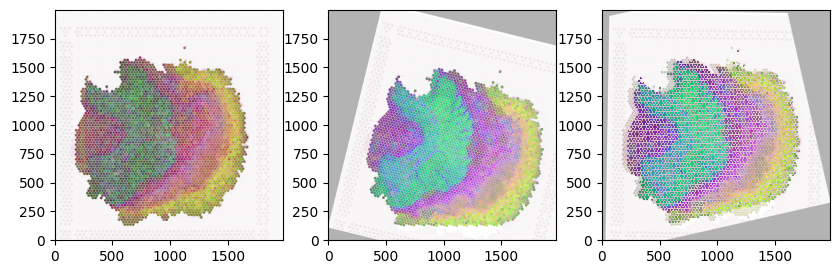

61.63604500890534 51.445594830429506


<Figure size 640x480 with 0 Axes>

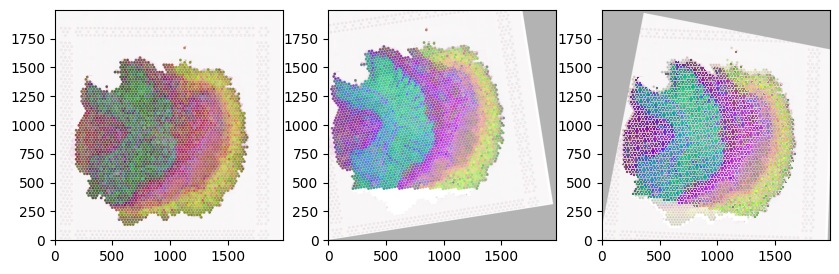

46.3044068456319 33.87511889403997


<Figure size 640x480 with 0 Axes>

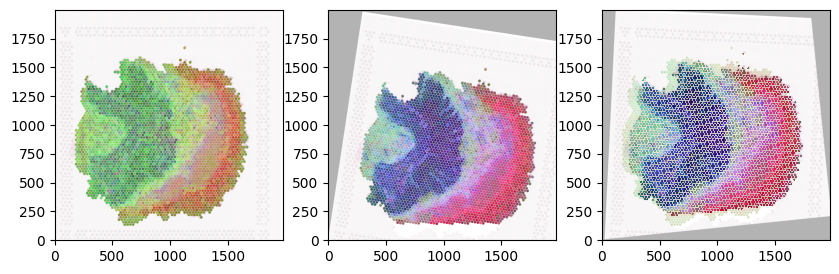

93.89392993527014 78.44390807440449


<Figure size 640x480 with 0 Axes>

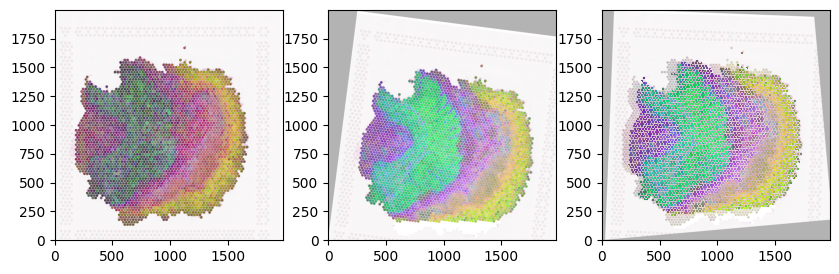

87.65415496431413 72.31654381738868


<Figure size 640x480 with 0 Axes>

In [29]:
all_dist = pd.DataFrame()
ad_pertub_name_list = pd.read_csv(simu_dataset_dir+level+'_noisy_simulation_data_names.csv', header=None)

for src_sample_name in ad_pertub_name_list[0]:
    dist_raw, dist_homo = align_img_to_st(src_sample_name)
    print(dist_raw, dist_homo)
    all_dist.loc[src_sample_name,'dist_raw'] = dist_raw
    all_dist.loc[src_sample_name,'dist_homo'] = dist_homo
    all_dist.to_csv(result_dir+level+'_noisy_omiclip_aligned_img_to_st_distance.csv')

### highly noisy

In [ ]:
level = 'highly'

In [ ]:
all_dist = pd.DataFrame()
ad_pertub_name_list = pd.read_csv(simu_dataset_dir+level+'_noisy_simulation_data_names.csv', header=None)

for src_sample_name in ad_pertub_name_list[0]:
    dist_raw, dist_homo = align_img_to_st(src_sample_name)
    print(dist_raw, dist_homo)
    all_dist.loc[src_sample_name,'dist_raw'] = dist_raw
    all_dist.loc[src_sample_name,'dist_homo'] = dist_homo
    all_dist.to_csv(result_dir+level+'_noisy_omiclip_aligned_img_to_st_distance.csv')